In [1]:
import locale
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

'en_US.UTF-8'

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!nvidia-smi

Sun May 12 19:03:51 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   30C    P0              44W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [4]:
!python -m pip install -q 'git+https://github.com/facebookresearch/detectron2.git'

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 73.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 17.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


In [5]:
# Now is a good time to confirm that we have the right versions of the libraries at our disposal.

import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
torch:  2.2 ; cuda:  cu121
detectron2: 0.6


In [6]:
# COMMON LIBRARIES
import os
import cv2

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer


from detectron2.data import build_detection_test_loader
from detectron2.evaluation import inference_on_dataset
from detectron2.evaluation import COCOEvaluator

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns



In [7]:
os.chdir("/content/drive/MyDrive/AMPBA/Capstone/Model/train")

In [8]:
base_folder = "/content/drive/MyDrive/AMPBA/Capstone/Model"

os.chdir(base_folder +"/train")

In [ ]:
# To view actual image
image = cv2.imread("../../../../Data Collection/K_Valid/Valid4.jpg")
cv2_imshow(image)

In [ ]:
# TO check what is the prediction with pre-trainned model

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(image)
visualizer = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])

model_final_f10217.pkl: 178MB [00:00, 227MB/s]                           


NameError: name 'image' is not defined

In [9]:
TRAIN_DATA_SET_NAME = "Train_Final"
TEST_DATA_SET_NAME = "Valid_Final"


register_coco_instances(TRAIN_DATA_SET_NAME, {}, base_folder + "/train/_annotations.coco.json", base_folder + "/train")
register_coco_instances(TEST_DATA_SET_NAME, {}, base_folder + "/valid/_annotations.coco.json", base_folder + "/valid")

In [10]:
# We can now confirm that our custom dataset was correctly registered using MetadataCatalog.

[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.endswith("Final")
]

['Train_Final', 'Valid_Final']

In [11]:
import json
def load_annotations(file_path):
    with open(file_path, 'r') as f:
        data = json.load(f)
    category_ids = {cat['id']: idx + 1 for idx, cat in enumerate(data['categories'])}  # +1 to reserve 0 for background
    return category_ids

In [12]:
NUM_CLASSES = len(load_annotations('_annotations.coco.json'))
NUM_CLASSES

8

In [26]:
# HYPERPARAMETERS



# mask_rcnn_R_101_FPN_3x.yaml
# mask_rcnn_X_101_32x8d_FPN_3x

ARCHITECTURE = "mask_rcnn_R_101_FPN_3x"
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"
MAX_ITER = 3200
EVAL_PERIOD = 300
BASE_LR = 0.1
NUM_CLASSES = NUM_CLASSES


# Learning rate scheduler settings
STEPS = [1000, 1500, 2500, 4000]  # Points to decrease the learning rate
GAMMA = 0.1  # Factor to reduce the learning rate by at each step
WARMUP_ITERS = 1000  # Number of iterations to increase the learning rate from zero to BASE_LR
WARMUP_FACTOR = 0.001  # Starting factor for learning rate
WARMUP_METHOD = "linear"  # Method used for the warmup



# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    TRAIN_DATA_SET_NAME,
    ARCHITECTURE,
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

#OUTPUT_DIR_PATH = '/content/drive/MyDrive/AMPBA/Capstone/Model/train/Train_Final/mask_rcnn_R_101_FPN_3x/2024-05-11-10-03-28'

In [28]:
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
cfg.DATASETS.TRAIN = (TRAIN_DATA_SET_NAME,)
cfg.DATASETS.TEST = (TEST_DATA_SET_NAME,)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1080
cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 32
cfg.SOLVER.IMS_PER_BATCH = 16
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.STEPS = STEPS
cfg.SOLVER.GAMMA = GAMMA

# Warmup
cfg.SOLVER.WARMUP_FACTOR = WARMUP_FACTOR
cfg.SOLVER.WARMUP_ITERS = WARMUP_ITERS
cfg.SOLVER.WARMUP_METHOD = WARMUP_METHOD

cfg.SOLVER.MAX_ITER = MAX_ITER
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.OUTPUT_DIR = OUTPUT_DIR_PATH
cfg.MODEL.DEVICE = torch.cuda.current_device()


# define Trainer
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)

[05/12 19:19:52 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


In [29]:
trainer.train()

[05/12 19:19:59 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[05/12 19:20:23 d2.utils.events]:  eta: 0:53:05  iter: 19  total_loss: 2.313  loss_cls: 1.376  loss_box_reg: 0.134  loss_mask: 0.6845  loss_rpn_cls: 0.113  loss_rpn_loc: 0.03646    time: 1.0120  last_time: 1.0532  data_time: 0.2433  last_data_time: 0.0616   lr: 0.0002881  max_mem: 39637M
[05/12 19:20:43 d2.utils.events]:  eta: 0:52:36  iter: 39  total_loss: 1.202  loss_cls: 0.2801  loss_box_reg: 0.1449  loss_mask: 0.6372  loss_rpn_cls: 0.09429  loss_rpn_loc: 0.04557    time: 1.0151  last_time: 0.9945  data_time: 0.0516  last_data_time: 0.0576   lr: 0.0004861  max_mem: 39637M
[05/12 19:21:03 d2.utils.events]:  eta: 0:52:12  iter: 59  total_loss: 1.015  loss_cls: 0.1987  loss_box_reg: 0.1339  loss_mask: 0.573  loss_rpn_cls: 0.08709  loss_rpn_loc: 0.03766    time: 1.0067  last_time: 0.9576  data_time: 0.0529  last_data_time: 0.0473   lr: 0.0006841  max_mem: 39637M
[05/12 19:21:25 d2.utils.events]:  eta: 0:51:41  iter: 79  total_loss: 0.9658  loss_cls: 0.2137  loss_box_reg: 0.1456  loss_ma

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 19:26:03 d2.utils.events]:  eta: 0:48:16  iter: 319  total_loss: 0.6022  loss_cls: 0.1576  loss_box_reg: 0.09524  loss_mask: 0.2685  loss_rpn_cls: 0.04233  loss_rpn_loc: 0.03053    time: 1.0892  last_time: 1.0279  data_time: 0.0519  last_data_time: 0.0477   lr: 0.0032581  max_mem: 39637M
[05/12 19:26:24 d2.utils.events]:  eta: 0:47:57  iter: 339  total_loss: 0.664  loss_cls: 0.1647  loss_box_reg: 0.1039  loss_mask: 0.3027  loss_rpn_cls: 0.0429  loss_rpn_loc: 0.0324    time: 1.0856  last_time: 1.0093  data_time: 0.0522  last_data_time: 0.0480   lr: 0.0034561  max_mem: 39637M
[05/12 19:26:44 d2.utils.events]:  eta: 0:47:38  iter: 359  total_loss: 0.557  loss_cls: 0.125  loss_box_reg: 0.07642  loss_mask: 0.2745  loss_rpn_cls: 0.04341  loss_rpn_loc: 0.02479    time: 1.0820  last_time: 1.0087  data_time: 0.0511  last_data_time: 0.0454   lr: 0.0036541  max_mem: 39637M
[05/12 19:27:08 d2.utils.events]:  eta: 0:47:21  iter: 379  total_loss: 0.6548  loss_cls: 0.1749  loss_box_reg: 0.1043

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 19:31:29 d2.utils.events]:  eta: 0:44:06  iter: 619  total_loss: 0.5517  loss_cls: 0.1428  loss_box_reg: 0.08341  loss_mask: 0.2455  loss_rpn_cls: 0.03319  loss_rpn_loc: 0.03058    time: 1.0863  last_time: 1.0632  data_time: 0.0473  last_data_time: 0.0548   lr: 0.0062281  max_mem: 39637M
[05/12 19:31:51 d2.utils.events]:  eta: 0:43:51  iter: 639  total_loss: 0.5421  loss_cls: 0.1583  loss_box_reg: 0.08314  loss_mask: 0.2566  loss_rpn_cls: 0.0309  loss_rpn_loc: 0.02471    time: 1.0858  last_time: 1.1266  data_time: 0.0508  last_data_time: 0.0494   lr: 0.0064261  max_mem: 39637M
[05/12 19:32:16 d2.utils.events]:  eta: 0:43:32  iter: 659  total_loss: 0.5699  loss_cls: 0.1497  loss_box_reg: 0.08941  loss_mask: 0.2542  loss_rpn_cls: 0.03706  loss_rpn_loc: 0.03141    time: 1.0902  last_time: 1.0704  data_time: 0.2168  last_data_time: 0.0225   lr: 0.0066241  max_mem: 39637M
[05/12 19:32:38 d2.utils.events]:  eta: 0:43:13  iter: 679  total_loss: 0.531  loss_cls: 0.1459  loss_box_reg: 0.

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 19:37:47 d2.utils.events]:  eta: 0:39:46  iter: 919  total_loss: 0.4993  loss_cls: 0.1456  loss_box_reg: 0.08013  loss_mask: 0.2292  loss_rpn_cls: 0.03046  loss_rpn_loc: 0.02302    time: 1.1412  last_time: 1.1050  data_time: 0.0506  last_data_time: 0.0577   lr: 0.0091981  max_mem: 39637M
[05/12 19:38:10 d2.utils.events]:  eta: 0:39:29  iter: 939  total_loss: 0.5578  loss_cls: 0.1685  loss_box_reg: 0.09173  loss_mask: 0.2367  loss_rpn_cls: 0.02691  loss_rpn_loc: 0.02688    time: 1.1408  last_time: 1.0988  data_time: 0.0533  last_data_time: 0.0543   lr: 0.0093961  max_mem: 39637M
[05/12 19:38:32 d2.utils.events]:  eta: 0:39:11  iter: 959  total_loss: 0.5244  loss_cls: 0.1442  loss_box_reg: 0.07119  loss_mask: 0.2364  loss_rpn_cls: 0.03033  loss_rpn_loc: 0.02635    time: 1.1402  last_time: 1.0829  data_time: 0.0550  last_data_time: 0.0522   lr: 0.0095941  max_mem: 39637M
[05/12 19:38:55 d2.utils.events]:  eta: 0:38:51  iter: 979  total_loss: 0.5279  loss_cls: 0.1569  loss_box_reg: 

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 19:43:31 d2.utils.events]:  eta: 0:35:45  iter: 1219  total_loss: 0.4434  loss_cls: 0.1233  loss_box_reg: 0.07433  loss_mask: 0.207  loss_rpn_cls: 0.02038  loss_rpn_loc: 0.02275    time: 1.1411  last_time: 1.2043  data_time: 0.0640  last_data_time: 0.0751   lr: 0.01  max_mem: 39637M
[05/12 19:43:54 d2.utils.events]:  eta: 0:35:28  iter: 1239  total_loss: 0.4549  loss_cls: 0.1276  loss_box_reg: 0.06968  loss_mask: 0.2159  loss_rpn_cls: 0.01865  loss_rpn_loc: 0.02021    time: 1.1412  last_time: 1.1457  data_time: 0.0630  last_data_time: 0.0542   lr: 0.01  max_mem: 39637M
[05/12 19:44:17 d2.utils.events]:  eta: 0:35:14  iter: 1259  total_loss: 0.4937  loss_cls: 0.1406  loss_box_reg: 0.08323  loss_mask: 0.2142  loss_rpn_cls: 0.02195  loss_rpn_loc: 0.02802    time: 1.1418  last_time: 1.2453  data_time: 0.0672  last_data_time: 0.0677   lr: 0.01  max_mem: 39637M
[05/12 19:44:40 d2.utils.events]:  eta: 0:34:58  iter: 1279  total_loss: 0.4669  loss_cls: 0.1487  loss_box_reg: 0.07608  los

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 19:49:24 d2.utils.events]:  eta: 0:31:43  iter: 1519  total_loss: 0.4529  loss_cls: 0.1186  loss_box_reg: 0.07057  loss_mask: 0.2018  loss_rpn_cls: 0.02025  loss_rpn_loc: 0.0218    time: 1.1472  last_time: 1.1458  data_time: 0.0661  last_data_time: 0.0701   lr: 0.001  max_mem: 39637M
[05/12 19:49:47 d2.utils.events]:  eta: 0:31:24  iter: 1539  total_loss: 0.3917  loss_cls: 0.1094  loss_box_reg: 0.06742  loss_mask: 0.1862  loss_rpn_cls: 0.01748  loss_rpn_loc: 0.01962    time: 1.1477  last_time: 1.2554  data_time: 0.0649  last_data_time: 0.0665   lr: 0.001  max_mem: 39637M
[05/12 19:50:11 d2.utils.events]:  eta: 0:31:05  iter: 1559  total_loss: 0.5139  loss_cls: 0.1583  loss_box_reg: 0.1044  loss_mask: 0.2054  loss_rpn_cls: 0.02471  loss_rpn_loc: 0.03066    time: 1.1484  last_time: 1.2199  data_time: 0.0697  last_data_time: 0.0605   lr: 0.001  max_mem: 39637M
[05/12 19:50:35 d2.utils.events]:  eta: 0:30:46  iter: 1579  total_loss: 0.4548  loss_cls: 0.1287  loss_box_reg: 0.07451  l

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 19:55:24 d2.utils.events]:  eta: 0:26:46  iter: 1819  total_loss: 0.423  loss_cls: 0.1253  loss_box_reg: 0.07968  loss_mask: 0.195  loss_rpn_cls: 0.0175  loss_rpn_loc: 0.02166    time: 1.1551  last_time: 1.1711  data_time: 0.0670  last_data_time: 0.0518   lr: 0.001  max_mem: 39637M
[05/12 19:55:47 d2.utils.events]:  eta: 0:26:25  iter: 1839  total_loss: 0.3914  loss_cls: 0.1085  loss_box_reg: 0.06532  loss_mask: 0.17  loss_rpn_cls: 0.01498  loss_rpn_loc: 0.02098    time: 1.1555  last_time: 1.1754  data_time: 0.0648  last_data_time: 0.0648   lr: 0.001  max_mem: 39637M
[05/12 19:56:12 d2.utils.events]:  eta: 0:26:04  iter: 1859  total_loss: 0.4374  loss_cls: 0.1246  loss_box_reg: 0.07455  loss_mask: 0.1885  loss_rpn_cls: 0.01511  loss_rpn_loc: 0.02336    time: 1.1561  last_time: 1.1947  data_time: 0.0694  last_data_time: 0.0811   lr: 0.001  max_mem: 39637M
[05/12 19:56:36 d2.utils.events]:  eta: 0:25:43  iter: 1879  total_loss: 0.435  loss_cls: 0.1122  loss_box_reg: 0.06983  loss_

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 20:01:29 d2.utils.events]:  eta: 0:21:21  iter: 2119  total_loss: 0.372  loss_cls: 0.09555  loss_box_reg: 0.06543  loss_mask: 0.1769  loss_rpn_cls: 0.01308  loss_rpn_loc: 0.01832    time: 1.1632  last_time: 1.2431  data_time: 0.0640  last_data_time: 0.0628   lr: 0.001  max_mem: 39637M
[05/12 20:01:53 d2.utils.events]:  eta: 0:20:59  iter: 2139  total_loss: 0.3626  loss_cls: 0.11  loss_box_reg: 0.06853  loss_mask: 0.1744  loss_rpn_cls: 0.01031  loss_rpn_loc: 0.01809    time: 1.1639  last_time: 1.2319  data_time: 0.0655  last_data_time: 0.0622   lr: 0.001  max_mem: 39637M
[05/12 20:02:18 d2.utils.events]:  eta: 0:20:36  iter: 2159  total_loss: 0.3875  loss_cls: 0.1041  loss_box_reg: 0.06438  loss_mask: 0.1713  loss_rpn_cls: 0.01415  loss_rpn_loc: 0.02116    time: 1.1644  last_time: 1.2315  data_time: 0.0650  last_data_time: 0.0664   lr: 0.001  max_mem: 39637M
[05/12 20:02:42 d2.utils.events]:  eta: 0:20:14  iter: 2179  total_loss: 0.4043  loss_cls: 0.115  loss_box_reg: 0.07136  lo

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 20:07:38 d2.utils.events]:  eta: 0:15:41  iter: 2419  total_loss: 0.3944  loss_cls: 0.1042  loss_box_reg: 0.05846  loss_mask: 0.1797  loss_rpn_cls: 0.01052  loss_rpn_loc: 0.01732    time: 1.1713  last_time: 1.2607  data_time: 0.0654  last_data_time: 0.0691   lr: 0.001  max_mem: 39637M
[05/12 20:08:03 d2.utils.events]:  eta: 0:15:17  iter: 2439  total_loss: 0.3633  loss_cls: 0.09609  loss_box_reg: 0.06313  loss_mask: 0.1745  loss_rpn_cls: 0.01075  loss_rpn_loc: 0.01555    time: 1.1717  last_time: 1.2431  data_time: 0.0662  last_data_time: 0.0645   lr: 0.001  max_mem: 39637M
[05/12 20:08:28 d2.utils.events]:  eta: 0:14:55  iter: 2459  total_loss: 0.4412  loss_cls: 0.1294  loss_box_reg: 0.08481  loss_mask: 0.1765  loss_rpn_cls: 0.01691  loss_rpn_loc: 0.02313    time: 1.1723  last_time: 1.2462  data_time: 0.0674  last_data_time: 0.0652   lr: 0.001  max_mem: 39637M
[05/12 20:08:53 d2.utils.events]:  eta: 0:14:31  iter: 2479  total_loss: 0.4017  loss_cls: 0.115  loss_box_reg: 0.0672  

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 20:13:54 d2.utils.events]:  eta: 0:09:48  iter: 2719  total_loss: 0.3892  loss_cls: 0.1091  loss_box_reg: 0.06781  loss_mask: 0.1674  loss_rpn_cls: 0.01274  loss_rpn_loc: 0.01951    time: 1.1797  last_time: 1.2751  data_time: 0.0658  last_data_time: 0.0520   lr: 0.0001  max_mem: 39637M
[05/12 20:14:19 d2.utils.events]:  eta: 0:09:24  iter: 2739  total_loss: 0.354  loss_cls: 0.09555  loss_box_reg: 0.06458  loss_mask: 0.1804  loss_rpn_cls: 0.01046  loss_rpn_loc: 0.02049    time: 1.1803  last_time: 1.2253  data_time: 0.0656  last_data_time: 0.0564   lr: 0.0001  max_mem: 39637M
[05/12 20:14:44 d2.utils.events]:  eta: 0:09:00  iter: 2759  total_loss: 0.3848  loss_cls: 0.1012  loss_box_reg: 0.06253  loss_mask: 0.1824  loss_rpn_cls: 0.01367  loss_rpn_loc: 0.02095    time: 1.1808  last_time: 1.2732  data_time: 0.0643  last_data_time: 0.0611   lr: 0.0001  max_mem: 39637M
[05/12 20:15:09 d2.utils.events]:  eta: 0:08:36  iter: 2779  total_loss: 0.3892  loss_cls: 0.09684  loss_box_reg: 0.07

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 20:20:14 d2.utils.events]:  eta: 0:03:43  iter: 3019  total_loss: 0.3618  loss_cls: 0.1011  loss_box_reg: 0.06335  loss_mask: 0.182  loss_rpn_cls: 0.01144  loss_rpn_loc: 0.02096    time: 1.1877  last_time: 1.2729  data_time: 0.0691  last_data_time: 0.0757   lr: 0.0001  max_mem: 39637M
[05/12 20:20:39 d2.utils.events]:  eta: 0:03:19  iter: 3039  total_loss: 0.3968  loss_cls: 0.1107  loss_box_reg: 0.07754  loss_mask: 0.1796  loss_rpn_cls: 0.01165  loss_rpn_loc: 0.02032    time: 1.1883  last_time: 1.2713  data_time: 0.0674  last_data_time: 0.0673   lr: 0.0001  max_mem: 39637M
[05/12 20:21:04 d2.utils.events]:  eta: 0:02:54  iter: 3059  total_loss: 0.3866  loss_cls: 0.1006  loss_box_reg: 0.06673  loss_mask: 0.1791  loss_rpn_cls: 0.01288  loss_rpn_loc: 0.02005    time: 1.1888  last_time: 1.2749  data_time: 0.0670  last_data_time: 0.0843   lr: 0.0001  max_mem: 39637M
[05/12 20:21:30 d2.utils.events]:  eta: 0:02:29  iter: 3079  total_loss: 0.4231  loss_cls: 0.1077  loss_box_reg: 0.0693

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 32 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [30]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir $OUTPUT_DIR_PATH

<IPython.core.display.Javascript object>

In [31]:
import yaml
from detectron2.config import CfgNode


# Convert the configuration to a YAML format string
cfg_yaml = cfg.dump()  # This serializes the configuration to a YAML formatted string.

# Define the path for the YAML configuration file
yaml_file_path = os.path.join(OUTPUT_DIR_PATH, "config_1080.yaml")

# Write the configuration to the file
with open(yaml_file_path, 'w') as file:
    file.write(cfg_yaml)




# Assuming `trainer` is your DefaultTrainer object and training is complete
final_weights_path = os.path.join(cfg.OUTPUT_DIR, "model_final_1080.pth")
# Save the model weights
torch.save(trainer.model.state_dict(), final_weights_path)

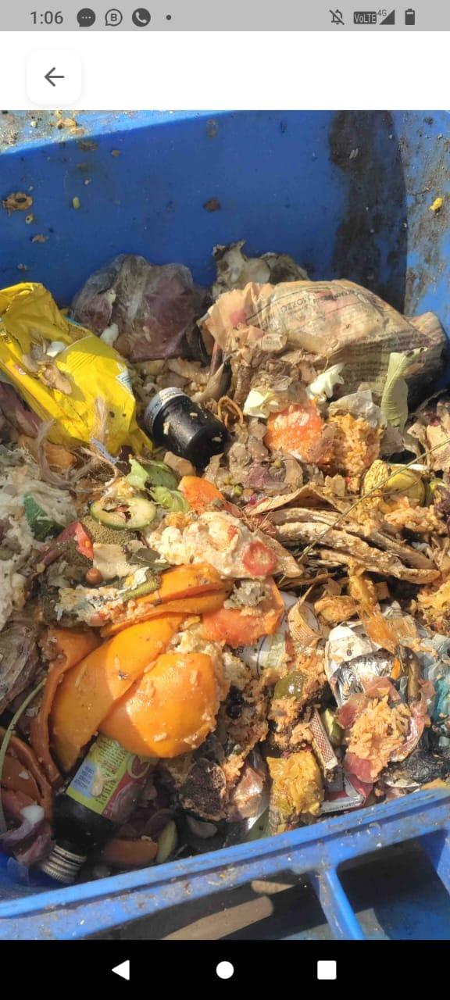

In [36]:
image = cv2.imread("../test/Test-5-_jpeg.rf.c4eea126e2fec0465791414ffc535726.jpg")
cv2_imshow(image)

[05/12 20:31:08 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from Train_Final/mask_rcnn_R_101_FPN_3x/2024-05-12-19-19-22/model_final.pth ...


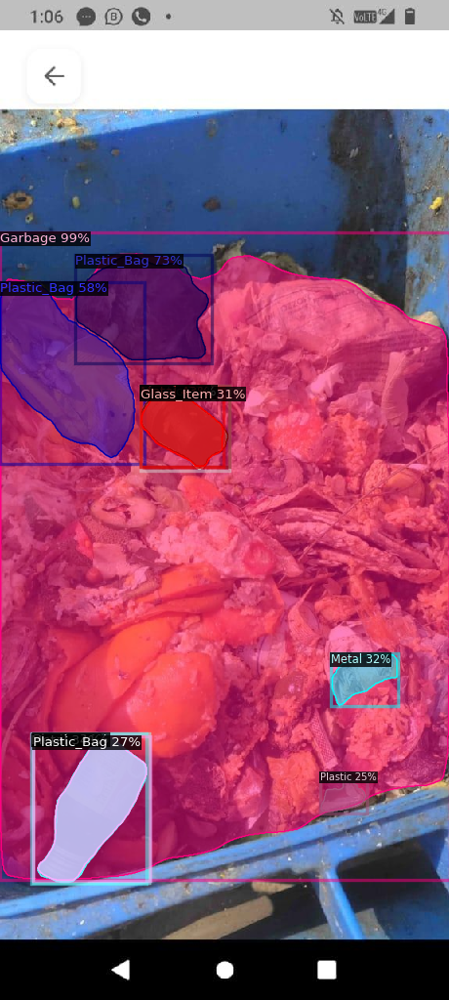

In [37]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.2
predictor = DefaultPredictor(cfg)
outputs = predictor(image)
visualizer = Visualizer(image[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=0.8)
out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(out.get_image()[:, :, ::-1])